In [2]:
import os
def read_urls(filename):
    f = open(filename,"r") 
    myList = {}

    for line in f:
        splitting = line.split()
        name =  os.path.basename(splitting[0]).split('?')[0] 
        if name in myList:
            myList[name].append(splitting[0])
        else:
            myList[name] = splitting
    f.close() 
    return myList


url = read_urls('path.txt')
rest_name = url.keys()
print (rest_name)
n_rest=len(rest_name)

['arbor-chicago', 'velvet-taco-chicago', 'the-purple-pig-chicago', 'boeufhaus-chicago', 'the-roost-carolina-kitchen-chicago', 'au-cheval-chicago', 'smoque-bbq-chicago', 'knife-and-tine-chicago-2', 'hq-howard-quintero-chicago-2', 'little-bad-wolf-chicago', 't-and-b-grill-chicago', 'big-and-littles-restaurant-chicago-2', 'the-angry-crab-chicago-3', 'farmhouse-chicago-3', 'jj-thai-street-food-chicago', 'gather-chicago', 'cafe-versailles-chicago', 'smalls-smoke-shack-and-more-chicago', 'girl-and-the-goat-chicago', 'mother-cluckers-kitchen-chicago']


In [3]:
#To get Username and COrresponding ratings from webpage
from bs4 import BeautifulSoup
import requests 
Ratings_lst=[]
user_rating ={}
for rest in url:
    for path in url[rest]:
        r=requests.get(path)
        soup=BeautifulSoup(r.content)
        #soup.findAll(attrs={"name":"description"})
        for each_div in soup.findAll('a',{'class':'user-display-name'}):
            #for i in soup.findAll('div',{'class':'rating-very-large'}):
            #    if i:
            count = 1
            i = soup.findAll('div',{'class':'rating-very-large'})[count]
            if each_div.text in user_rating:
                user_rating[each_div.text].append((i.find('i').get('title'), rest))
            else:             
                user_rating[each_div.text] = [(i.find('i').get('title'), rest)]
            count = count +1
    #print (i.attrs.has_key
    #print i.get('title')
       # Ratings_lst.append(i.find('i').get('title'))
print (user_rating)


{u'Rebecca D.': [('5.0 star rating', 'au-cheval-chicago')], u'Dori S.': [('1.0 star rating', 'smoque-bbq-chicago')], u'Cami P.': [('5.0 star rating', 'big-and-littles-restaurant-chicago-2')], u'Alicia M.': [('5.0 star rating', 'smalls-smoke-shack-and-more-chicago')], u'Gary B.': [('5.0 star rating', 'little-bad-wolf-chicago')], u'John I.': [('5.0 star rating', 'big-and-littles-restaurant-chicago-2')], u'Gina V.': [('5.0 star rating', 'the-angry-crab-chicago-3')], u'Shahzad S.': [('5.0 star rating', 'the-roost-carolina-kitchen-chicago')], u'Amanda K.': [('5.0 star rating', 'knife-and-tine-chicago-2')], u'Megan M.': [('1.0 star rating', 'boeufhaus-chicago')], u'Steve S.': [('5.0 star rating', 'cafe-versailles-chicago')], u'Colleen M.': [('5.0 star rating', 'au-cheval-chicago')], u'Lisa H.': [('4.0 star rating', 'the-angry-crab-chicago-3')], u'Andrew F.': [('1.0 star rating', 'big-and-littles-restaurant-chicago-2')], u'Paul G.': [('5.0 star rating', 'smoque-bbq-chicago'), ('5.0 star ratin

In [4]:
n_users=len(user_rating)

In [5]:
#Write the Dictionary of List of Tuples of Username, Ratings and Restaurant name
import csv
writer = csv.writer(open('Final_input_file.csv', 'wb'))
for key in user_rating:
    temp = []
    temp.append(key)
    for value in user_rating[key]:
        for x in value:
            temp.append(x)
    writer.writerow(temp)

In [6]:
import csv
reader = csv.reader(open('Final_input_file.csv', 'r'))
dictionary_input_file = {}
for row in reader:
    x = len(row)
    dictionary_input_file[row[0]] = row[1:]
print dictionary_input_file

{'Rebecca D.': ['5.0 star rating', 'au-cheval-chicago'], 'Dori S.': ['1.0 star rating', 'smoque-bbq-chicago'], 'Cami P.': ['5.0 star rating', 'big-and-littles-restaurant-chicago-2'], 'Alicia M.': ['5.0 star rating', 'smalls-smoke-shack-and-more-chicago'], 'Gary B.': ['5.0 star rating', 'little-bad-wolf-chicago'], 'John I.': ['5.0 star rating', 'big-and-littles-restaurant-chicago-2'], 'Gina V.': ['5.0 star rating', 'the-angry-crab-chicago-3'], 'Shahzad S.': ['5.0 star rating', 'the-roost-carolina-kitchen-chicago'], 'Amanda K.': ['5.0 star rating', 'knife-and-tine-chicago-2'], 'Megan M.': ['1.0 star rating', 'boeufhaus-chicago'], 'Steve S.': ['5.0 star rating', 'cafe-versailles-chicago'], 'Colleen M.': ['5.0 star rating', 'au-cheval-chicago'], 'Lisa H.': ['4.0 star rating', 'the-angry-crab-chicago-3'], 'Andrew F.': ['1.0 star rating', 'big-and-littles-restaurant-chicago-2'], 'Paul G.': ['5.0 star rating', 'smoque-bbq-chicago', '5.0 star rating', 'the-angry-crab-chicago-3'], 'Dan V.': ['1

In [7]:
len(dictionary_input_file)

535

In [8]:
dic_row = {}
for i in dictionary_input_file:
    list1 = []
    for j in range(len(dictionary_input_file[i])):
        if j%2 != 0:
            list1.append(dictionary_input_file[i][j])
    dic_row[i] = list1
    

In [9]:
type(dictionary_input_file.values())

list

In [10]:
import math
import numpy as np
from scipy.sparse import csr_matrix, lil_matrix,csc_matrix
from sklearn.feature_extraction.text import CountVectorizer

In [11]:
restaurant_names=[]
userratings_numpy_array_lst=[]

for i in user_rating.values():
    if i[0][1] not in restaurant_names:
        restaurant_names.append(i[0][1])
        userratings_numpy_array_lst.append( i[0][0])
restaurant = np.array(restaurant_names) 
restaurant.tolist()

['au-cheval-chicago',
 'smoque-bbq-chicago',
 'big-and-littles-restaurant-chicago-2',
 'smalls-smoke-shack-and-more-chicago',
 'little-bad-wolf-chicago',
 'the-angry-crab-chicago-3',
 'the-roost-carolina-kitchen-chicago',
 'knife-and-tine-chicago-2',
 'boeufhaus-chicago',
 'cafe-versailles-chicago',
 'farmhouse-chicago-3',
 'the-purple-pig-chicago',
 't-and-b-grill-chicago',
 'mother-cluckers-kitchen-chicago',
 'girl-and-the-goat-chicago',
 'arbor-chicago',
 'gather-chicago',
 'velvet-taco-chicago',
 'hq-howard-quintero-chicago-2',
 'jj-thai-street-food-chicago']

In [12]:
userratings_numpy_array_lst=[]
for i in user_rating.values():
    userratings_numpy_array_lst.append( i[0][0])
ratings=[]
for i in userratings_numpy_array_lst:
    ratings.append(float(i.split()[0]))
rates = np.array(ratings)
rates.tolist()

[5.0,
 1.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 1.0,
 5.0,
 5.0,
 4.0,
 1.0,
 5.0,
 1.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 4.0,
 5.0,
 5.0,
 5.0,
 4.0,
 5.0,
 5.0,
 5.0,
 5.0,
 4.0,
 4.0,
 5.0,
 5.0,
 1.0,
 4.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 1.0,
 5.0,
 5.0,
 4.0,
 5.0,
 1.0,
 4.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 1.0,
 4.0,
 5.0,
 1.0,
 5.0,
 5.0,
 1.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 1.0,
 1.0,
 5.0,
 1.0,
 1.0,
 5.0,
 5.0,
 4.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 1.0,
 5.0,
 1.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 1.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 1.0,
 1.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 4.0,
 5.0,
 5.0,
 5.0,
 5.0,
 1.0,
 5.0,
 4.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 4.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 5.0,
 4.0,
 5.0,
 5.0,
 5.0

In [13]:
user_rating

{u'Aaron Jae M.': [('5.0 star rating',
   'big-and-littles-restaurant-chicago-2')],
 u'Aaron P.': [('5.0 star rating', 'the-purple-pig-chicago'),
  ('1.0 star rating', 'farmhouse-chicago-3')],
 u'Aaron S.': [('5.0 star rating', 'little-bad-wolf-chicago')],
 u'Adam D.': [('5.0 star rating', 'smalls-smoke-shack-and-more-chicago')],
 u'Adam W.': [('5.0 star rating', 'velvet-taco-chicago'),
  ('4.0 star rating', 'the-roost-carolina-kitchen-chicago')],
 u'Aditi M.': [('4.0 star rating', 'farmhouse-chicago-3')],
 u'Adriana R.': [('1.0 star rating', 'big-and-littles-restaurant-chicago-2')],
 u'Adrienne H.': [('5.0 star rating', 'velvet-taco-chicago'),
  ('5.0 star rating', 'velvet-taco-chicago')],
 u'Aj A.': [('5.0 star rating', 'gather-chicago')],
 u'Albert K.': [('5.0 star rating', 'the-roost-carolina-kitchen-chicago')],
 u'Alex A.': [('5.0 star rating', 'au-cheval-chicago'),
  ('4.0 star rating', 'au-cheval-chicago'),
  ('5.0 star rating', 'knife-and-tine-chicago-2'),
  ('5.0 star rating',

In [14]:
user_rating_dict = {}
for i in user_rating:
    rate = [0.0]*len(rest_name)
    for j in user_rating[i]:
        rating = float(j[0].split()[0])
        index = rest_name.index(j[1])
        rate[index] = rating
    user_rating_dict[i] = rate
print user_rating_dict

{u'Rebecca D.': [0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], u'Dori S.': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], u'Cami P.': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], u'Alicia M.': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0], u'Gary B.': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], u'John I.': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], u'Gina V.': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], u'Shahzad S.': [0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], u'Amanda K.': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [15]:
a=csr_matrix(np.array(ratings))

In [16]:
#Ratings Matrix
matrix = []
for user in sorted(user_rating):
    array= [0. for i in rest_name]
    for rating in user_rating[user]:
        rate = float(rating[0].split()[0])
        array[rest_name.index(rating[1])] = 1.* rate
    matrix.append(array)
csrmatrix = csr_matrix(matrix)
print csrmatrix

  (0, 11)	5.0
  (1, 2)	5.0
  (1, 13)	1.0
  (2, 9)	5.0
  (3, 17)	5.0
  (4, 1)	5.0
  (4, 4)	4.0
  (5, 13)	4.0
  (6, 11)	1.0
  (7, 1)	5.0
  (8, 15)	5.0
  (9, 4)	5.0
  (10, 5)	4.0
  (10, 7)	5.0
  (11, 14)	5.0
  (12, 15)	5.0
  (13, 12)	5.0
  (14, 17)	5.0
  (15, 5)	5.0
  (16, 4)	5.0
  (16, 9)	5.0
  (17, 13)	1.0
  (18, 7)	5.0
  (19, 6)	5.0
  (20, 8)	5.0
  :	:
  (521, 3)	1.0
  (522, 8)	5.0
  (523, 7)	5.0
  (524, 3)	1.0
  (525, 7)	5.0
  (526, 14)	5.0
  (526, 19)	5.0
  (527, 2)	5.0
  (528, 9)	5.0
  (529, 17)	5.0
  (530, 13)	4.0
  (531, 2)	5.0
  (532, 5)	4.0
  (533, 10)	5.0
  (534, 15)	4.0
  (535, 15)	4.0
  (536, 9)	5.0
  (536, 17)	5.0
  (537, 4)	5.0
  (538, 6)	1.0
  (539, 6)	1.0
  (540, 17)	5.0
  (541, 8)	5.0
  (542, 3)	5.0
  (543, 11)	1.0


In [17]:
Cuisines_lst=[]
f = open('Cousine.txt',"r")
for i in f:
    Cuisines_lst.append(i)
print Cuisines_lst
len(Cuisines_lst)

['American (New)\n', 'Tapas/Small Plates, Mediterranean\n', 'American (New)\n', 'Latin American\n', 'American (Traditional), Bars\n', 'Wine Bars, American (New)\n', 'American (New), Fish & Chips, Burgers\n', 'American (New)\n', 'American (New), Coffee & Tea, Breakfast & Brunch\n', 'American (Traditional)\n', 'Southern\n', 'Southern\n', 'American (New), Mexican\n', 'Brasseries, Cocktail Bars, Sandwiches\n', 'Cafes, Creperies\n', 'American (New), Bars, Diners\n', 'Barbeque\n', 'Barbeque, American (New), American (Traditional)\n', 'American (New)\n', 'Seafood, Southern, Cajun/Creole']


20

In [18]:
vectorizer = CountVectorizer(token_pattern=r'(?u)\b\w+\b', dtype=np.float)
Cuisine_matrix = vectorizer.fit_transform(Cuisines_lst)
vocabulary = np.array(vectorizer.get_feature_names())
print Cuisine_matrix.todense()
print vocabulary

[[ 1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.
   0.  0.  1.  0.  0.  1.  0.  1.  0.  0.  0.]
 [ 1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.
   0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.]
 [ 1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  1.]
 [ 1.  0.  0.  0.  0.  0.  1.  0.  0.  1.  0.  0.  0.  0.  0.  1.  0.  0.
   0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 1.  0.  0.  0.  1.  1.  0.  0

In [19]:
def document_frequencies(Cuisine_matrix):
    from collections import Counter  
    return 1.*np.array(dict(Counter(Cuisine_matrix.indices)).values())
    
dfs = document_frequencies(Cuisine_matrix)
dfs

array([ 13.,   2.,   4.,   1.,   1.,   1.,   1.,   1.,   1.,   1.,   1.,
         1.,   1.,   1.,   1.,   1.,   1.,   1.,   1.,  10.,   1.,   1.,
         1.,   1.,   3.,   1.,   1.,   3.,   1.])

In [20]:
def tfidf(Cuisine_matrix, dfs):
    Cuisine_matrix1 = Cuisine_matrix.copy()
    return csr_matrix(Cuisine_matrix1/dfs)
    

# tfidf matrix: row=movie, col=term
tfidf_matrix = tfidf(Cuisine_matrix, dfs)
tfidf_matrix.todense()

matrix([[ 0.07692308,  0.        ,  0.        ,  0.        ,  0.        ,
          0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
          0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
          0.        ,  0.        ,  0.        ,  0.        ,  0.1       ,
          0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
          0.        ,  0.        ,  0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
          0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
          0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
          0.        ,  0.        ,  1.        ,  0.        ,  0.        ,
          1.        ,  0.        ,  0.        ,  1.        ,  0.        ,
          1.        ,  0.        ,  0.        ,  0.        ],
        [ 0.07692308,  0.        ,  0.        ,  0.        ,  0.        ,
          0.        ,  0.        ,  0.        ,  0.        ,  

In [21]:
def make_user_profiles(ratings, tfidf_matrix):
    return csr_matrix(csrmatrix.dot(tfidf_matrix)/csrmatrix.sum(axis=1))

user_profiles = make_user_profiles(csrmatrix, tfidf_matrix)
#print type(user_profiles)
user_profiles.todense()

matrix([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.06410256,  0.        ,  0.04166667, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.07692308,  0.        ,  0.        , ...,  0.        ,
          0.33333333,  0.        ],
        ..., 
        [ 0.07692308,  0.        ,  0.        , ...,  1.        ,
          0.        ,  0.        ],
        [ 0.07692308,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ]])

In [22]:
def norm(vector):
    """
    Compute the Euclidean norm of one row of a csr_matrix.
    no
    Input:
      vector...one row from a csr_matrix
    Returns:
      a float, the Euclidean norm of the vector.
    """
    ###TODO
    ###
    return np.sqrt(np.sum([x*x for x in  vector.toarray()]))



In [23]:
def cosine(v1, v2):
    """
    Compute the cosine similarity between two vectors (rows from a csr_matrix).
    https://en.wikipedia.org/wiki/Cosine_similarity
    Params:
      v1...one vector
      v2...another vector
    Returns:
      a float representing the cosine similarity/
    """
    nrm_val = norm(v1) * norm(v2)
    
    return np.dot (v1.toarray(),v2.T.toarray()) / (nrm_val)



In [24]:
#Jaccard Similarity
import numpy as np
from sklearn.metrics import jaccard_similarity_score
scores = []
for i in dic_row:
    for j in dic_row:
        if i != j:     
            scores.append(( 1. * len(set(dic_row[i]) & set(dic_row[j])) / 
                               len(set(dic_row[i]) | set(dic_row[j]))))
print scores

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3333333333333333, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3333333333333333, 0.0, 0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3333333333333333, 0.0,

In [25]:
def predict_ratings_w_user_profiles(ratings, user_profiles, tfidf_matrix):
    """
    Make a copy of the ratings matrix. Replace each 0 entry with a predicted score
    based on user_profile. Specifically, the ratings of user i for movie j is the 
    cosine similarity between user i's profile and movie's j tfidf vector.
    
    Params:
      ratings.........the user x movie ratings matrix.
      user_profiles...the user x term profile matrix
      tfidf_matrix....the move x term tfidf matrix
    Returns:
      a user x movie csr_matrix of ratings. It should be a copy of the original
      ratings matrix, where 0 values have been replaced by the prediced rating.
    """
    ###TODO
    ###
    rating1 = ratings.copy()
    for i in range(ratings.shape[0]):
        for j in range(ratings.shape[1]):
            if ratings[i,j] == 0.:
                rating1[i,j] = cosine(user_profiles[i],tfidf_matrix[j])
    return rating1

predicted = predict_ratings_w_user_profiles(csrmatrix, user_profiles, tfidf_matrix)
predicted.todense()

C:\Users\Hari\Anaconda\lib\site-packages\scipy\sparse\compressed.py:730: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  SparseEfficiencyWarning)


matrix([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.18898224],
        [ 0.33910783,  0.        ,  5.        , ...,  0.09340438,
          0.33910783,  0.        ],
        [ 0.13709926,  0.        ,  0.13709926, ...,  0.57199149,
          0.13709926,  0.        ],
        ..., 
        [ 0.06295648,  0.        ,  0.06295648, ...,  0.01734083,
          0.06295648,  0.        ],
        [ 0.04676268,  0.        ,  0.04676268, ...,  0.01877953,
          0.04676268,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.18898224]])

In [26]:
for i in range(predicted.shape[0]):
    for j in range(predicted.shape[1]):
        print predicted[i,j],
    print "\n"

0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 5.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.188982236505 

0.339107832478 0.0 5.0 0.0158575912895 0.11683185297 0.0735516309455 0.0246354729628 0.339107832478 0.0213490343413 0.0464914332027 0.0 0.0 0.0424464584683 1.0 0.0 0.0735516309455 0.0 0.0934043840478 0.339107832478 0.0 

0.137099260914 0.0 0.137099260914 0.0172459369047 0.807381827531 0.0166561455162 0.00995997382538 0.137099260914 0.0086312864201 5.0 0.0 0.0 0.017160848341 0.0 0.0 0.0166561455162 0.0 0.57199148598 0.137099260914 0.0 

0.27544154131 0.0 0.27544154131 0.0187795312915 0.461815531283 0.0334633050731 0.0200102504097 0.27544154131 0.0173408289672 0.57199148598 0.0 0.0 0.0344772866442 0.0 0.0 0.0334633050731 0.795779176166 5.0 0.27544154131 0.0 

0.0184965594447 5.0 0.0184965594447 0.00232671201152 4.0 0.0259825691105 0.00134373625869 0.0184965594447 0.00116447821301 0.134913633534 0.0 0.0 0.00231523240421 0.0140848560744 0.0 0.0259825691105 0.0 0.0771694497241 0.0184965594447 0.0 



In [27]:
from math import*

def jaccard_similarity(x,y):
    intersection_cardinality = len(set.intersection(*[set(x), set(y)]))
    union_cardinality = len(set.union(*[set(x), set(y)]))
    return intersection_cardinality/float(union_cardinality)

ans = []
for i in dic_row:
    for j in dic_row:
        if i != j:
            ans.append(jaccard_similarity(user_rating_dict[i],user_rating_dict[j]))

topi = np.argsort(ans)[::-1][:10]
j = zip(topi, np.array(ans)[topi])

print j


#for idx, corr in j:
    #print corr, idx

[(184681, 1.0), (70241, 1.0), (117549, 1.0), (70260, 1.0), (70259, 1.0), (70258, 1.0), (70257, 1.0), (70255, 1.0), (70254, 1.0), (70253, 1.0)]


In [95]:
#Pearson correlation

from scipy.stats import pearsonr

def find_similar_by_pearson_correlation(movie, X):
    for i in dic_row:
        for j in dic_row:
            if i != j:     
                scores.append(pearsonr(movie[i],X[j]))
print scores


find_similar_by_pearson_correlation(user_rating_dict,user_rating_dict)

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3333333333333333, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3333333333333333, 0.0, 0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3333333333333333, 0.0,

In [30]:
dictionary_input_file.keys()[0]

'Rebecca D.'

In [34]:
user_rating_dict = {}
for i in user_rating:
    rate = [0.0]*len(rest_name)
    for j in user_rating[i]:
        rating = float(j[0].split()[0])
        index = rest_name.index(j[1])
        rate[index] = rating
    user_rating_dict[i] = rate

In [32]:
user_rating_dict= user_rating_dict.tocsr()

AttributeError: 'dict' object has no attribute 'tocsr'

ValueError: setting an array element with a sequence.

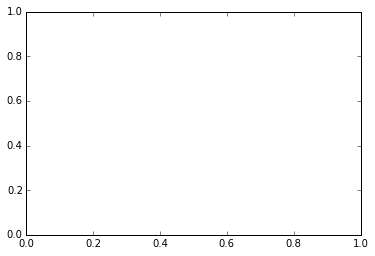

In [94]:
import matplotlib.pyplot as plt
from numpy import arange
%matplotlib inline

def drawgraph(x,y):
    plt.figure()
    plt.plot(x,y, 'ro')
    plt.xlabel('Restaurants')
    plt.ylabel('Ratings')
    plt.show()
    
drawgraph(scores, rates)
    

In [35]:
from scipy.sparse import csr_matrix, coo_matrix
def convert(term_dict):
    term_dict_v = list(term_dict.itervalues())
    term_dict_k = list(term_dict.iterkeys())
    coo = coo_matrix(term_dict_v, zip(*term_dict_k))
    return csr_matrix(coo)

user_rating_matrix=convert(user_rating_dict)


In [45]:
#jaccard matrix

jaccard_matrix = convert(scores)

AttributeError: 'list' object has no attribute 'itervalues'

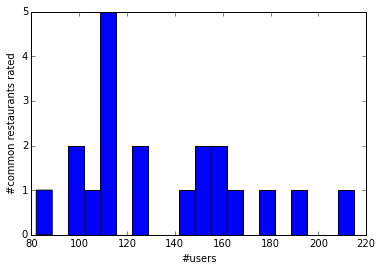

In [87]:
import matplotlib.pyplot as plt
from numpy import arange
%matplotlib inline
# Next let's plot the number of ratings per users
ratings_per_user = user_rating_matrix.sum(axis=0).tolist()[0]

plt.figure()
plt.hist(ratings_per_user, bins=20)
plt.xlabel('#users')
plt.ylabel('#common restaurants rated')
plt.show()


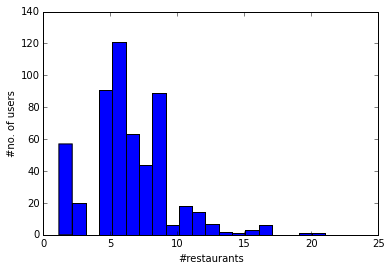

In [88]:
import matplotlib.pyplot as plt
%matplotlib inline
# Now we can count the predicted ratings with user profiles using cosine.
ratings_per_user = predicted.sum(axis=1).transpose().tolist()[0]

plt.figure()
plt.hist(ratings_per_user, bins=20)
plt.xlabel('#restaurants')
plt.ylabel('#no. of users')
plt.show()

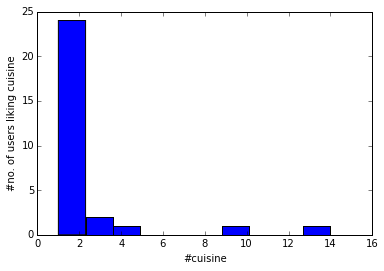

In [57]:
import matplotlib.pyplot as plt
%matplotlib inline
# Now we can count the predicted ratings with user profiles using jaccard.
ratings_per_user = Cuisine_matrix.sum(axis=0).tolist()[0]

plt.figure()
plt.hist(ratings_per_user, bins=10)
plt.xlabel('#cuisine')
plt.ylabel('#no. of users liking cuisine')
plt.show()


In [76]:
def pearsoncor(X, Y, code = 0):
    """
    Computes pearson's correlation coefficient.
    code
       0 - using deviations from means.
       1 - common formula.
    """
    n = len(X)
    sx = ssd(X)
    sy = ssd(Y)
    xbar = float(sum(X)) / n
    ybar = float(sum(Y)) / n
    if code == 0:
       return sum([(x - xbar) * (y - ybar) for x, y in zip (X,Y)])/(sx * sy*(n-1.0))
    else:
       numer = sum([x*y for x,y in zip(X,Y)]) - n*(xbar * ybar)
       denom = sqrt((sum([x*x for x in X]) - n* xbar**2)*(sum([y*y for y in Y]) -n* ybar**2))
       return (numer /denom)

scores2 = []
for i in dic_row:
    for j in dic_row:
        if i != j:     
            scores2.pearsoncor(dic_row[i], dic_row[j],0)
print scores2
 

AttributeError: 'list' object has no attribute 'pearsoncor'